In [7]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
Setup complete. Using torch 2.1.0+cu118 (Tesla V100-SXM2-16GB)


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="5OvXWSh55pkJ665BWAWe")
project = rf.workspace("mangziriteam").project("mungzirith")
dataset = project.version(23).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to mungziriTH-23 in yolov5pytorch:: 100%|██████████| 1690/1690 [00:00<00:00, 4058.94it/s]


In [9]:
!python train.py --img 640 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

2023-10-24 16:57:04.047154: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-24 16:57:04.047213: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-24 16:57:04.047250: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=/content/mungziriTH-23/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False,

[Errno 2] No such file or directory: '{HOME}'
/content/yolov5


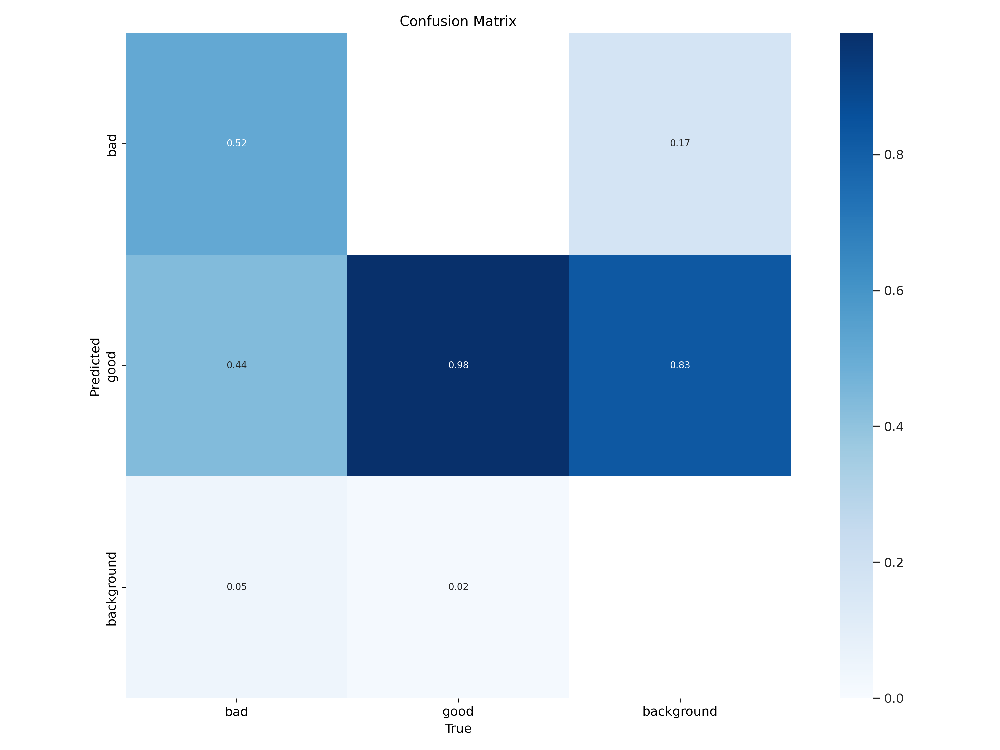

In [11]:
Image(filename=f'/content/yolov5/runs/train/exp2/confusion_matrix.png', width=600)

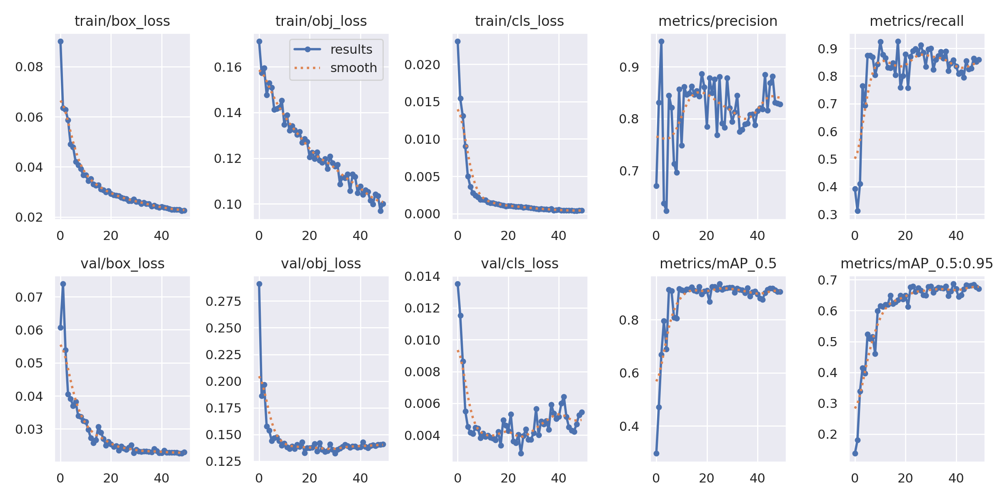

In [12]:
Image(filename=f'/content/yolov5/runs/train/exp2/results.png', width=600)

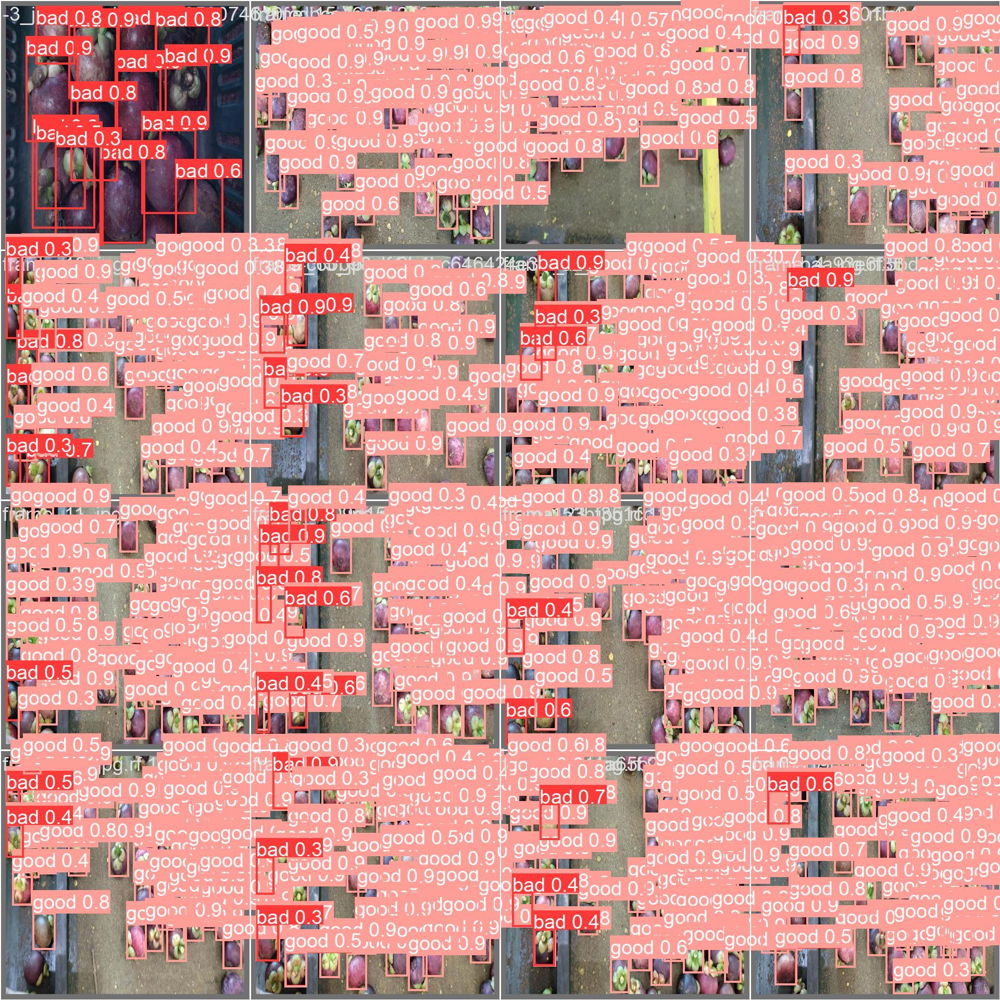

In [13]:
Image(filename=f'/content/yolov5/runs/train/exp2/val_batch0_pred.jpg', width=600)

In [29]:
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --data {dataset.location}/data.yaml

val: data=/content/mungziriTH-23/data.yaml, weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-228-g4d687c8 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
Model summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /content/yolov5/mungziriTH-23/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100% 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:06<00:00,  3.03s/it]
                   all         40       1376      0.788      0.859      0.906      0.687
                   bad         40        186       0.79      0.727       0

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [17]:
!python /content/yolov5/detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/mungziriTH-23/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-228-g4d687c8 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
Model summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
image 1/64 /content/mungziriTH-23/test/images/-10_jpg.rf.0ff2ded1f158e1d471e28e7213873736.jpg: 640x640 18 bads, 7.1ms
image 2/64 /content/mungziriTH-23/test/images/-3_jpg.rf.9605ddfa3e048821e02662a3385b0b60.jpg: 640x640 16 bads, 9.4ms
image 3/64 /content/mungziriTH-23/test/images/-4_jp

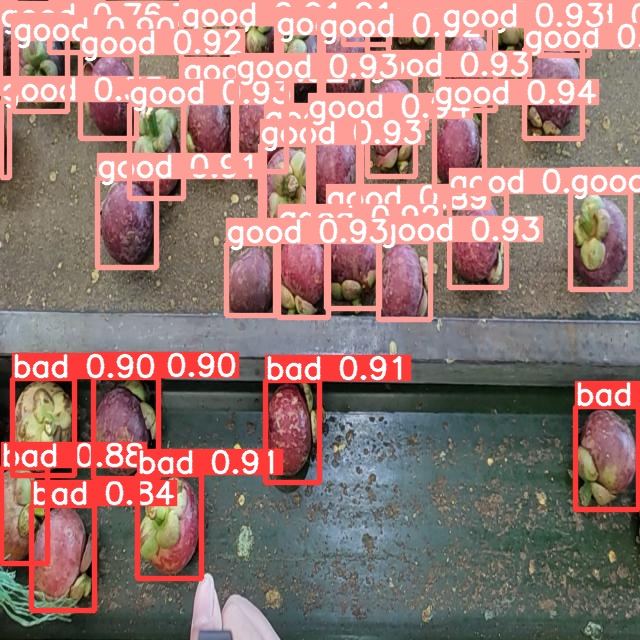

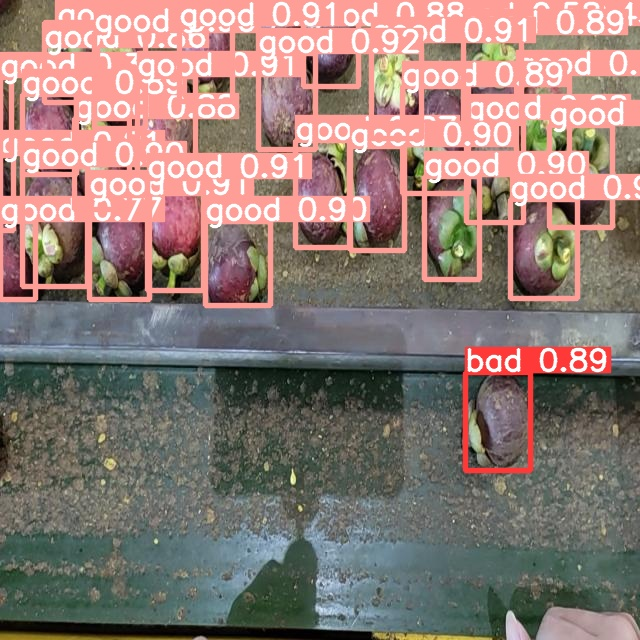

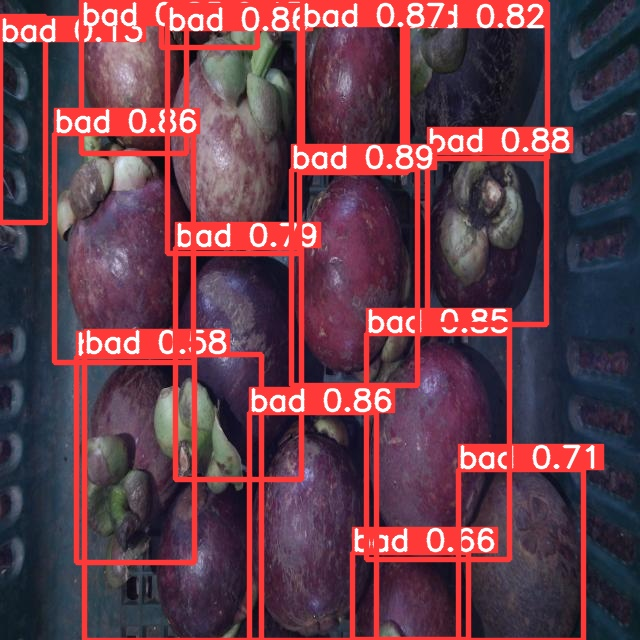

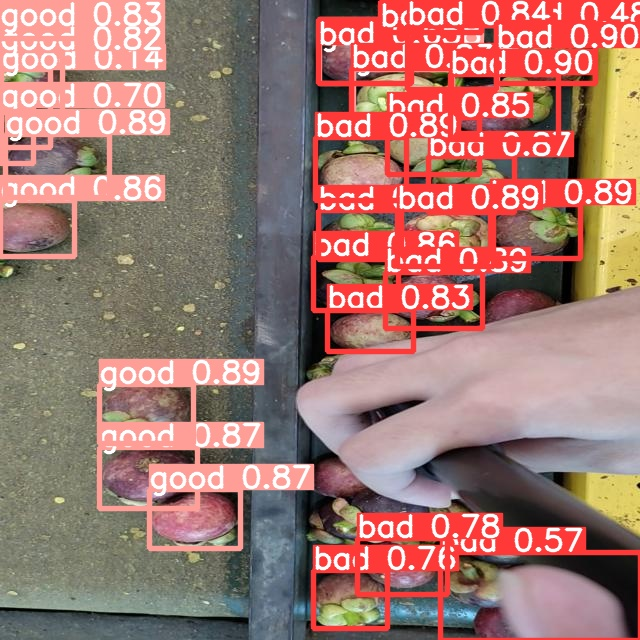

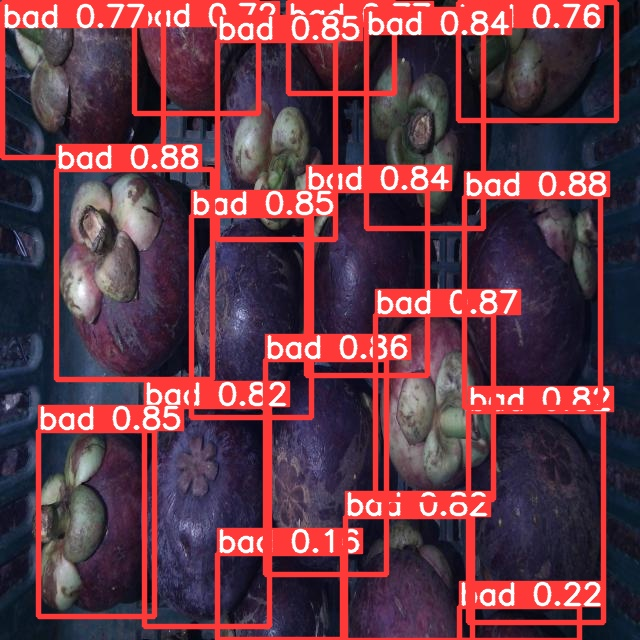

...

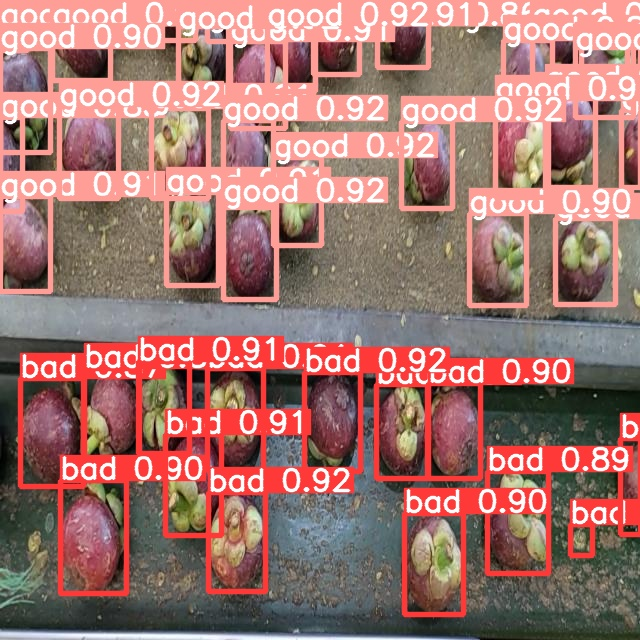

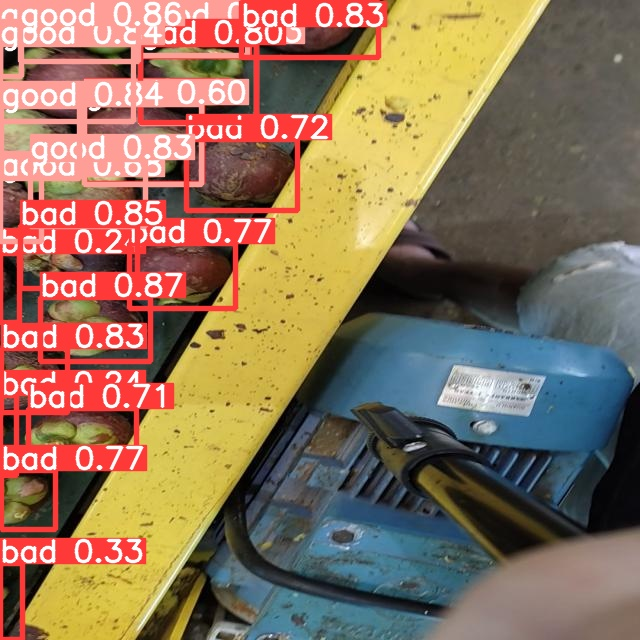

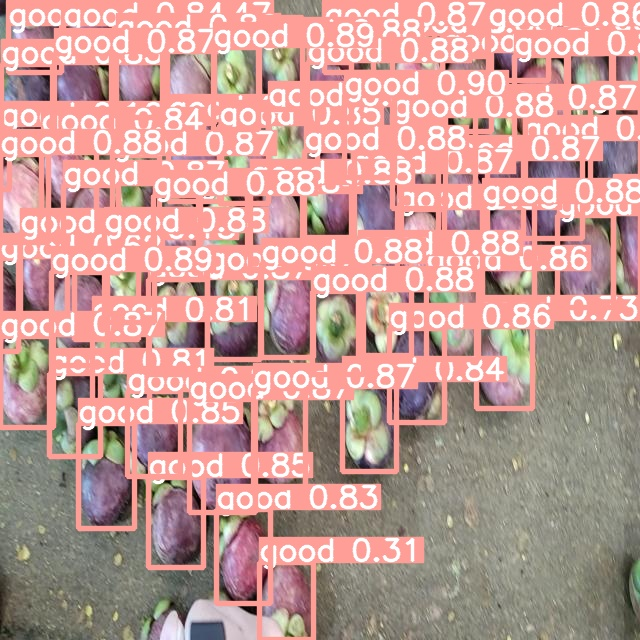

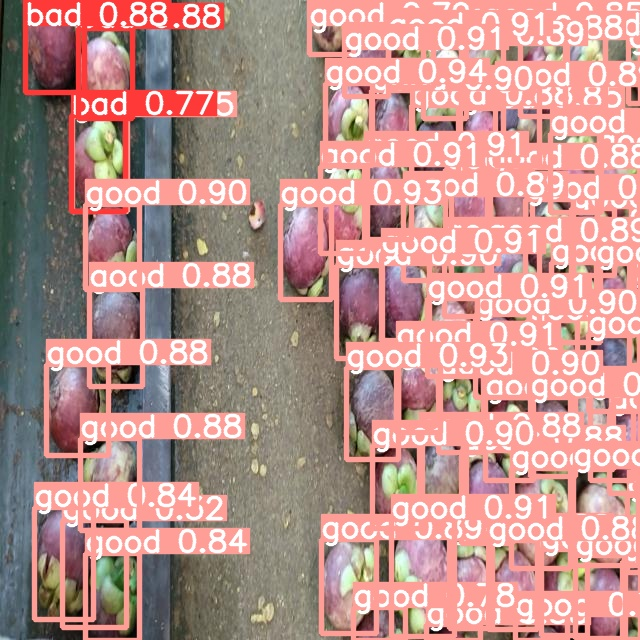

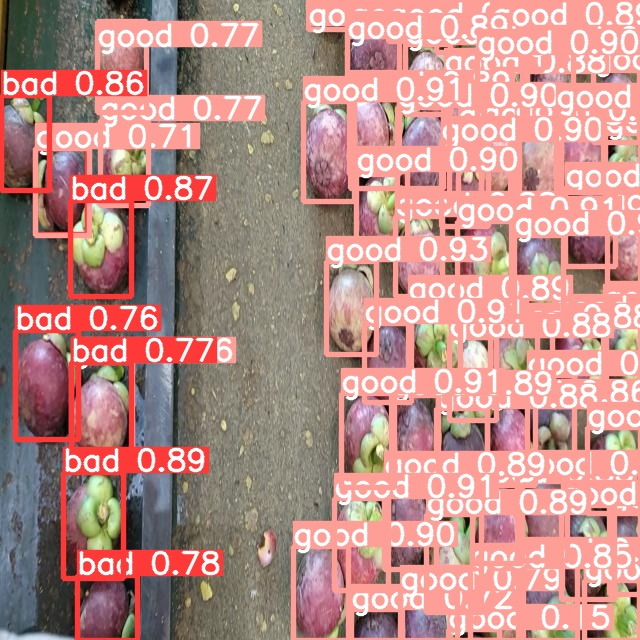

In [18]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import files
files.download("/content/yolov5/runs/val/exp3")

In [31]:
!zip -r /content/exp3.zip /content/yolov5/runs/val/exp3

  adding: content/yolov5/runs/val/exp3/ (stored 0%)
  adding: content/yolov5/runs/val/exp3/P_curve.png (deflated 15%)
  adding: content/yolov5/runs/val/exp3/F1_curve.png (deflated 12%)
  adding: content/yolov5/runs/val/exp3/val_batch1_labels.jpg (deflated 5%)
  adding: content/yolov5/runs/val/exp3/val_batch1_pred.jpg (deflated 4%)
  adding: content/yolov5/runs/val/exp3/confusion_matrix.png (deflated 35%)
  adding: content/yolov5/runs/val/exp3/R_curve.png (deflated 11%)
  adding: content/yolov5/runs/val/exp3/PR_curve.png (deflated 16%)


In [27]:
!python /content/yolov5/detect.py --source /content/test.mp4

detect: weights=yolov5s.pt, source=/content/test.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-228-g4d687c8 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 285, in <module>
    main(opt)
  File "/content/yolov5/detect.py", line 280, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/content/yol